In [53]:
# Ignore  the warnings
import warnings
warnings.filterwarnings('always')
warnings.filterwarnings('ignore')

# data visualisation and manipulation
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib import style
import seaborn as sns

#configure
# sets matplotlib to inline and displays graphs below the corressponding cell.
%matplotlib inline  
style.use('fivethirtyeight')
sns.set(style='whitegrid',color_codes=True)
import pandas_profiling
import autoviz
#import the necessary modelling algos.

#classifiaction.
from sklearn.linear_model import LogisticRegression
from sklearn.svm import LinearSVC,SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.naive_bayes import GaussianNB

#regression
from sklearn.linear_model import LinearRegression,Ridge,Lasso,RidgeCV
from sklearn.ensemble import RandomForestRegressor,BaggingRegressor,GradientBoostingRegressor,AdaBoostRegressor
from sklearn.svm import SVR
from sklearn.neighbors import KNeighborsRegressor

#model selection
from sklearn.model_selection import train_test_split,cross_validate
from sklearn.model_selection import KFold
from sklearn.model_selection import GridSearchCV

#evaluation metrics
from sklearn.metrics import mean_squared_log_error,mean_squared_error, r2_score,mean_absolute_error # for regression
from sklearn.metrics import accuracy_score,precision_score,recall_score,f1_score  # for classification
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

**Reading the data**

In [ ]:
data=pd.read_csv('winequality-red.csv')

In [55]:
data.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


**Statistical information and general information about the data**

In [56]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1599 entries, 0 to 1598
Data columns (total 12 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   fixed acidity         1599 non-null   float64
 1   volatile acidity      1599 non-null   float64
 2   citric acid           1599 non-null   float64
 3   residual sugar        1599 non-null   float64
 4   chlorides             1599 non-null   float64
 5   free sulfur dioxide   1599 non-null   float64
 6   total sulfur dioxide  1599 non-null   float64
 7   density               1599 non-null   float64
 8   pH                    1599 non-null   float64
 9   sulphates             1599 non-null   float64
 10  alcohol               1599 non-null   float64
 11  quality               1599 non-null   int64  
dtypes: float64(11), int64(1)
memory usage: 150.0 KB


In [57]:
data.describe().T

,count,mean,std,min,25%,50%,75%,max
fixed acidity,1599.0,8.319637,1.741096,4.60000,7.1000,7.90000,9.200000,15.90000
volatile acidity,1599.0,0.527821,0.179060,0.12000,0.3900,0.52000,0.640000,1.58000
citric acid,1599.0,0.270976,0.194801,0.00000,0.0900,0.26000,0.420000,1.00000
residual sugar,1599.0,2.538806,1.409928,0.90000,1.9000,2.20000,2.600000,15.50000
chlorides,1599.0,0.087467,0.047065,0.01200,0.0700,0.07900,0.090000,0.61100
free sulfur dioxide,1599.0,15.874922,10.460157,1.00000,7.0000,14.00000,21.000000,72.00000
total sulfur dioxide,1599.0,46.467792,32.895324,6.00000,22.0000,38.00000,62.000000,289.00000
density,1599.0,0.996747,0.001887,0.99007,0.9956,0.99675,0.997835,1.00369
pH,1599.0,3.311113,0.154386,2.74000,3.2100,3.31000,3.400000,4.01000
sulphates,1599.0,0.658149,0.169507,0.33000,0.5500,0.62000,0.730000,2.00000


In [58]:
data['quality'].unique()

array([5, 6, 7, 4, 8, 3], dtype=int64)

**EDA**

In [59]:
## EDA
pandas_profiling.ProfileReport(data, title="Pandas Profiling Report", explorative=True)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Shape of your Data Set loaded: (1599, 12)
#######################################################################################
######################## C L A S S I F Y I N G  V A R I A B L E S  ####################
#######################################################################################
Classifying variables in data set...
    12 Predictors classified...
        No variables removed since no ID or low-information variables found in data set
To fix data quality issues automatically, import FixDQ from autoviz...
    Alert: Dropping 240 duplicate rows can sometimes cause column data types to change to object. Double-check!


,Data Type,Missing Values%,Unique Values%,Minimum Value,Maximum Value,DQ Issue
fixed acidity,float64,0.000000,NA,4.600000,15.900000,has 41 outliers greater than upper bound (12.35) or lower than lower bound(3.95). Cap them or remove them.
volatile acidity,float64,0.000000,NA,0.120000,1.580000,has 19 outliers greater than upper bound (1.02) or lower than lower bound(0.02). Cap them or remove them.
citric acid,float64,0.000000,NA,0.000000,1.000000,has 1 outliers greater than upper bound (0.94) or lower than lower bound(-0.42). Cap them or remove them.
residual sugar,float64,0.000000,NA,0.900000,15.500000,has 126 outliers greater than upper bound (3.65) or lower than lower bound(0.85). Cap them or remove them.
chlorides,float64,0.000000,NA,0.012000,0.611000,has 87 outliers greater than upper bound (0.12) or lower than lower bound(0.04). Cap them or remove them.
free sulfur dioxide,float64,0.000000,NA,1.000000,72.000000,has 26 outliers greater than upper bound (42.00) or lower than lower bound(-14.00). Cap them or remove them.
total sulfur dioxide,float64,0.000000,NA,6.000000,289.000000,has 45 outliers greater than upper bound (124.50) or lower than lower bound(-39.50). Cap them or remove them.
density,float64,0.000000,NA,0.990070,1.003690,has 35 outliers greater than upper bound (1.00) or lower than lower bound(0.99). Cap them or remove them.
pH,float64,0.000000,NA,2.740000,4.010000,has 28 outliers greater than upper bound (3.68) or lower than lower bound(2.92). Cap them or remove them.
sulphates,float64,0.000000,NA,0.330000,2.000000,has 55 outliers greater than upper bound (1.00) or lower than lower bound(0.28). Cap them or remove them.


Number of All Scatter Plots = 66


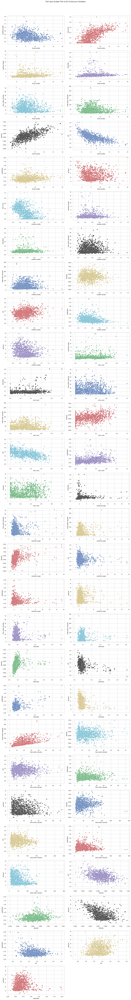

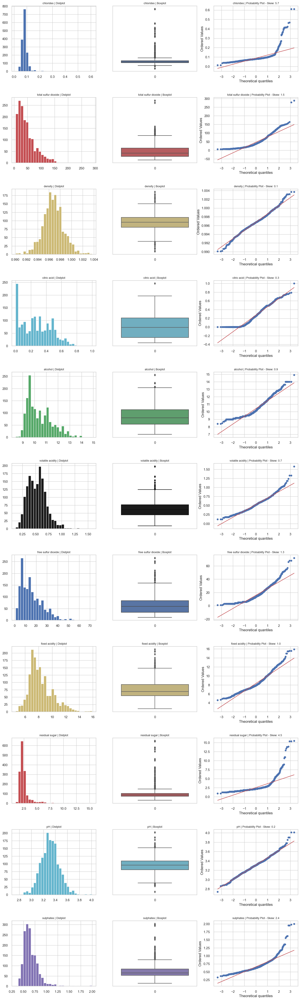

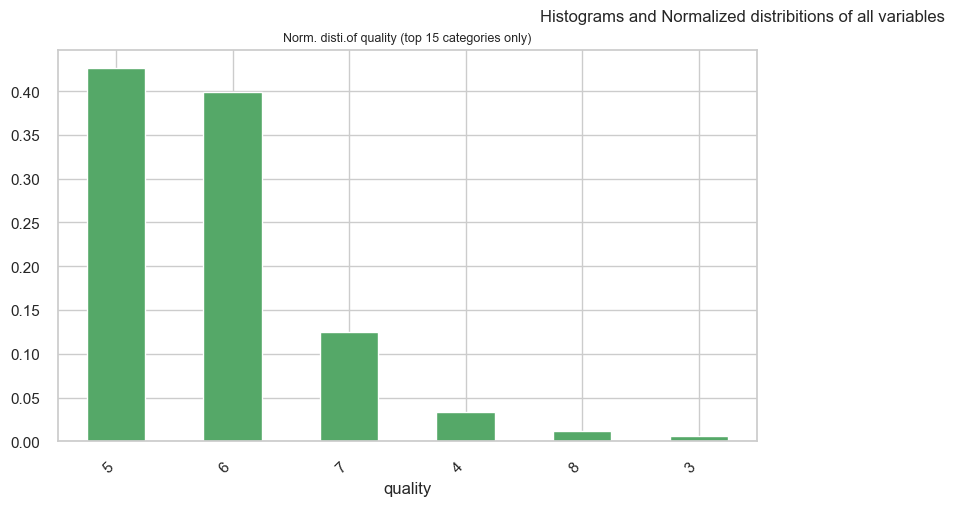

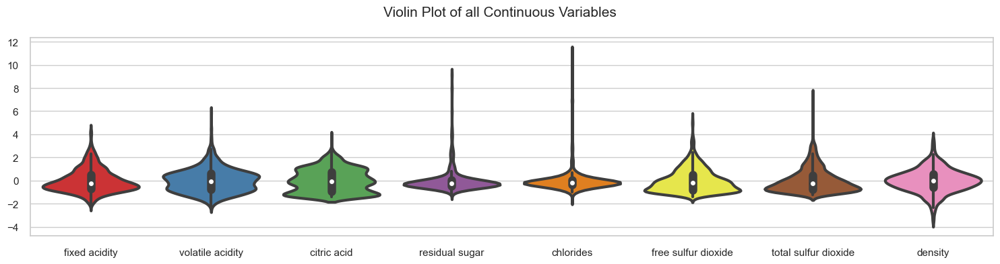

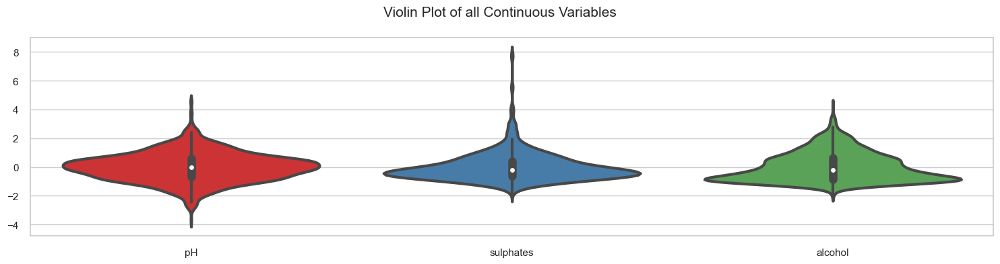

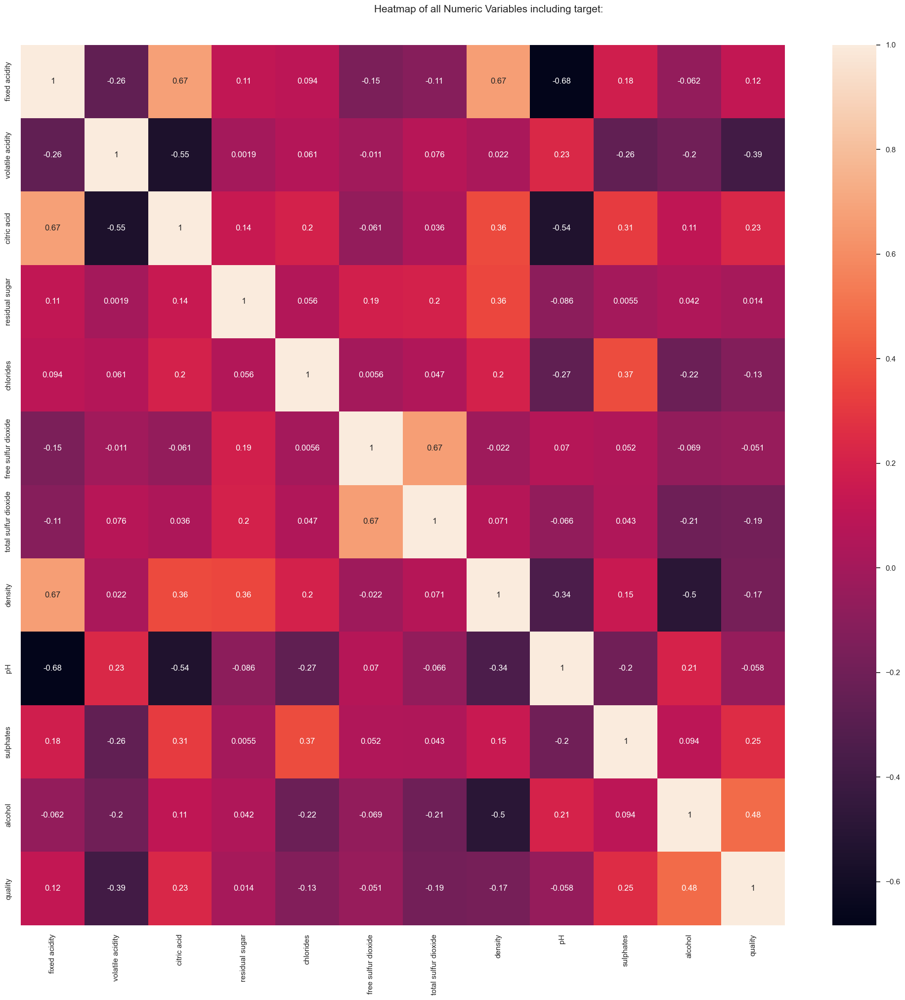

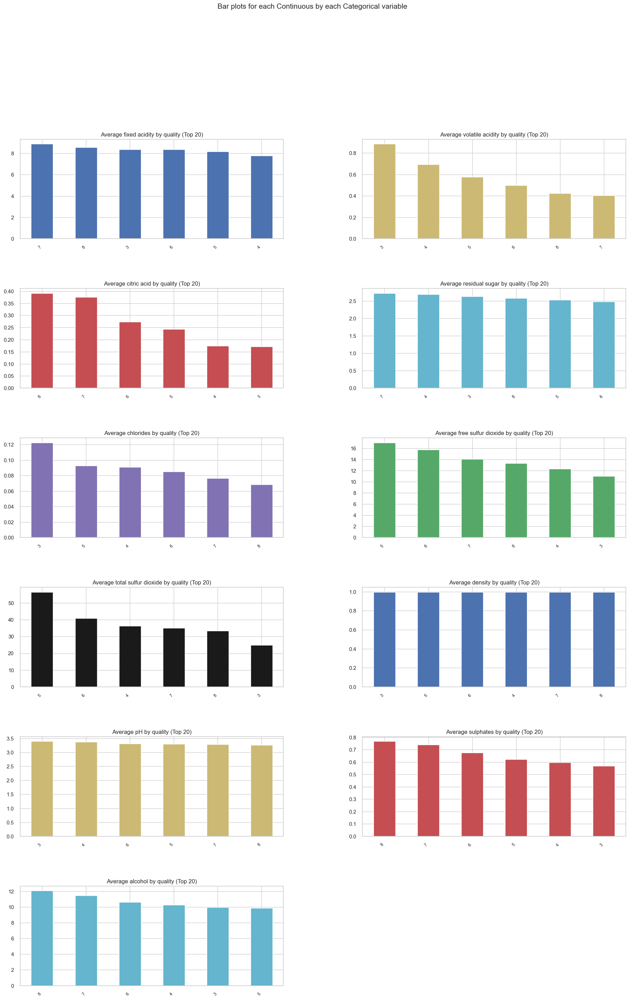

All Plots done
Time to run AutoViz = 16 seconds 

 ###################### AUTO VISUALIZATION Completed ########################


In [60]:
from autoviz.AutoViz_Class import AutoViz_Class
AV = AutoViz_Class()
df = AV.AutoViz('winequality-red.csv')

**Data preprocessing**

In [61]:
#duplicate value
data.duplicated().sum()

240

In [62]:
data=data.drop_duplicates()

In [63]:
#outliers

In [64]:
for i in data.columns:
    q1 = data[i].quantile(0.25)
    q3 = data[i].quantile(0.75)
    iqr = q3 - q1
    upper = q3 + 1.5 * iqr
    lower = q1 - 1.5 * iqr
    
    # Identify outliers using a boolean mask
    outliers = (data[i] < lower) | (data[i] > upper)
    
    # Filter the data to exclude outliers
    data = data[~outliers]

**Model building**

In [65]:

X=data.drop('quality',axis=1)
y=data['quality']


In [66]:
y=y.apply(lambda y_value : 1 if y_value>=7 else 0)

In [67]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2)

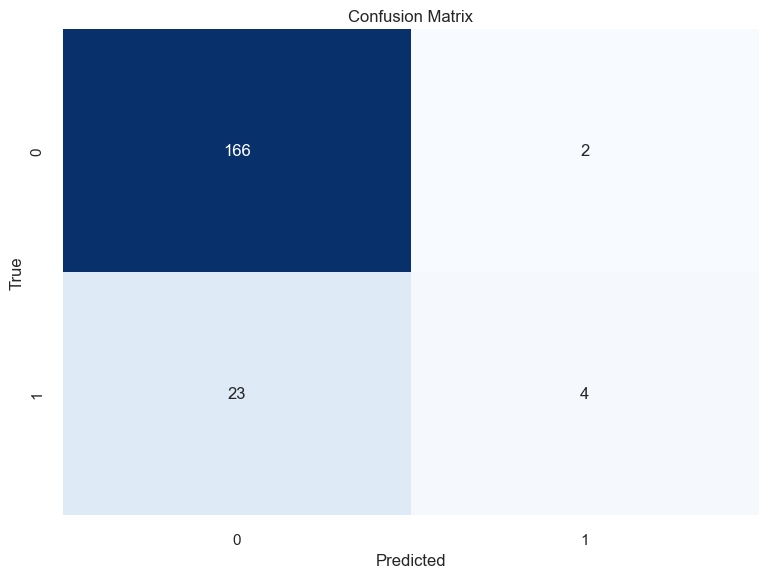

Accuracy: 0.8717948717948718
Classification Report:
               precision    recall  f1-score   support

           0       0.88      0.99      0.93       168
           1       0.67      0.15      0.24        27

    accuracy                           0.87       195
   macro avg       0.77      0.57      0.59       195
weighted avg       0.85      0.87      0.83       195



In [68]:
# Create a Logistic Regression model
model1 = LogisticRegression()

# Fit the model to the training data
model1.fit(X_train, y_train)

# Predict using the model on the test data
pred = model1.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, pred)

# Generate classification report
class_report = classification_report(y_test, pred)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, pred)

# Display the confusion matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=model.classes_, yticklabels=model.classes_)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

print("Accuracy:", accuracy)
print("Classification Report:\n", class_report)

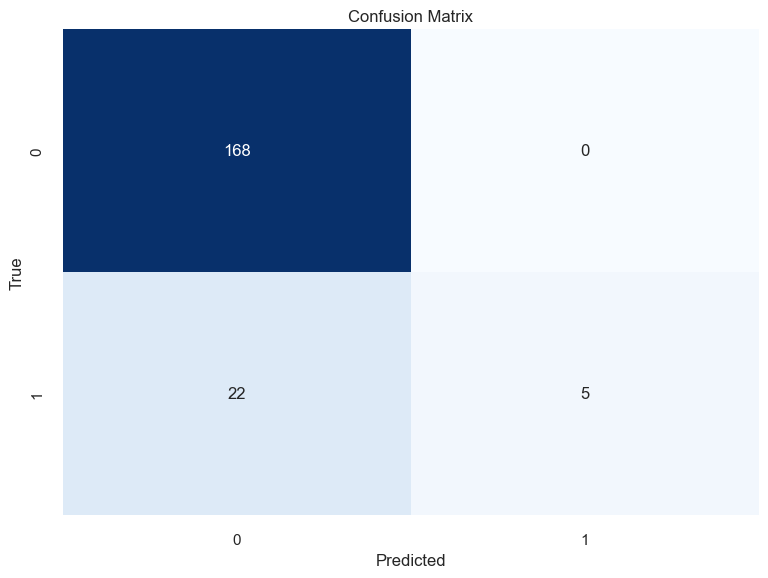

Accuracy: 0.8871794871794871
Classification Report:
               precision    recall  f1-score   support

           0       0.88      1.00      0.94       168
           1       1.00      0.19      0.31        27

    accuracy                           0.89       195
   macro avg       0.94      0.59      0.63       195
weighted avg       0.90      0.89      0.85       195



In [69]:
#RandomForestClassifier
model = RandomForestClassifier()

# Fit the model to the training data
model.fit(X_train, y_train)

# Predict using the model on the test data
pred = model.predict(X_test)

# Calculate accuracy
accuracy = accuracy_score(y_test, pred)

# Generate classification report
class_report = classification_report(y_test, pred)

# Generate confusion matrix
conf_matrix = confusion_matrix(y_test, pred)

# Display the confusion matrix using a heatmap
plt.figure(figsize=(8, 6))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", cbar=False,
            xticklabels=model.classes_, yticklabels=model.classes_)
plt.xlabel("Predicted")
plt.ylabel("True")
plt.title("Confusion Matrix")
plt.show()

print("Accuracy:", accuracy)
print("Classification Report:\n", class_report)

In [70]:
#example of prediction 
input_data=[7.4,0.7,0.0,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4]
prediction=model.predict(np.asarray(input_data).reshape(1,-1))
prediction
if prediction[0]==1:
    print('good quality wine')
else:
    print('bad quality wine')

bad quality wine
